In [198]:
import pandas as pd 
import numpy as np

from tqdm.notebook import tqdm

import matplotlib.pyplot as plt
import seaborn as sns

from transformers import AutoTokenizer, AutoModelForSequenceClassification
from scipy.special import softmax


import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
import torch
import requests
from bs4 import BeautifulSoup
import re

In [199]:
import warnings
warnings.filterwarnings("ignore")

In [200]:
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\johnh\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

## Data Load

In [201]:
df = pd.read_csv('data_files/df_reuters_news_preprocessed.csv')

In [202]:
df.shape

(57806, 21)

In [203]:
#df.head().T

Relevant information for this dataset refers only to the news category date, news text and the cleaned up version of it.

In [204]:
df = df.iloc[:,-3:].copy()
df.dropna(inplace= True)
df['date'] = pd.to_datetime(df['news_category_date'])
df.drop(columns= ['news_category_date'], inplace= True)

In [205]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 57772 entries, 0 to 57805
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   newsText       57772 non-null  object        
 1   newsText4Algo  57772 non-null  object        
 2   date           57772 non-null  datetime64[ns]
dtypes: datetime64[ns](1), object(2)
memory usage: 1.8+ MB


In [206]:
#df= df.iloc[:20]

### Bert Model

In [207]:
tokenizer = AutoTokenizer.from_pretrained('nlptown/bert-base-multilingual-uncased-sentiment')
model = AutoModelForSequenceClassification.from_pretrained('nlptown/bert-base-multilingual-uncased-sentiment')

In [208]:
def sentiment_score_bert(review):

    tokens = tokenizer.encode(review, return_tensors='pt')
    result = model(tokens)

    row_count[0] += 1

    print('iteration ', row_count[0])
    print('news: ', review[:10], 'properly processed')
    return int(torch.argmax(result.logits))+1

In [209]:
row_count = [0]

In [210]:
df['sentiment_bert'] = df['newsText4Algo'].apply(lambda x: sentiment_score_bert(x[:512]))

iteration  1
news:  new york g properly processed
iteration  2
news:  new york w properly processed
iteration  3
news:   hong kong properly processed
iteration  4
news:  asian shar properly processed
iteration  5
news:  us stock i properly processed
iteration  6
news:  oil back b properly processed
iteration  7
news:   axon manu properly processed
iteration  8
news:  new york w properly processed
iteration  9
news:  new yorklo properly processed
iteration  10
news:  new york i properly processed
iteration  11
news:  baltimore  properly processed
iteration  12
news:   credit su properly processed
iteration  13
news:  parishong  properly processed
iteration  14
news:  chicagodim properly processed
iteration  15
news:  beijing ch properly processed
iteration  16
news:  hong kong  properly processed
iteration  17
news:  hong kong  properly processed
iteration  18
news:  hong kong  properly processed
iteration  19
news:  new york g properly processed
iteration  20
news:  chinese tr properly

In [211]:
df['sentiment_dummy_bert'] = df['sentiment_bert'].map({1: 'negative', 2: 'neutral', 3: 'positive'})

In [212]:
df.to_csv('df_reuters_bert_new.csv', index = False)

In [213]:
df.head()

,newsText,newsText4Algo,date,sentiment_bert,sentiment_dummy_bert
0,NEW YORK Global stock markets jumped on the fi...,new york global stock markets jumped first day...,2020-01-02,1,negative
1,NEW YORK Wall Street’s major indexes notched r...,new york wall streets major indexes notched re...,2020-01-02,1,negative
2,Hong Kong is the bank’s single most important...,hong kong banks single important market accou...,2020-01-02,1,negative
3,Asian shares gained for the fourth successive ...,asian shares gained fourth successive month de...,2020-01-02,2,neutral
4,U.S. stock index futures rose on the first tra...,us stock index futures rose first trading day ...,2020-01-02,1,negative


In [214]:
df_pivot = pd.pivot_table((df.groupby(['sentiment_bert','sentiment_dummy_bert']).
                          count().reset_index()), index = 'sentiment_bert', columns= 'sentiment_dummy_bert',
                          aggfunc='sum', fill_value=0)
df_pivot.columns = [f'{col[0]}_{str(col[1])}' for col in df_pivot.columns.values]
df_pivot = df_pivot.iloc[:,3:].reset_index()
df_pivot['TotalOriginal'] = df_pivot.iloc[:,1:].sum(axis = 1)
totals_rows = pd.DataFrame(df_pivot.sum(axis = 0)).T
df_pivot = df_pivot.reset_index(drop = True)
df_pivot = pd.concat([df_pivot, totals_rows]).reset_index(drop = True)
df_pivot.loc[df_pivot.index[-1], 'sentiment_bert'] = 'TotalBERTSentiment'
df_pivot.set_index('sentiment_bert', inplace = True)

df_pivot.iloc[:,:].style.background_gradient(cmap='viridis')

,newsText_negative,newsText_neutral,newsText_positive,newsText4Algo_negative,newsText4Algo_neutral,newsText4Algo_positive,TotalOriginal
sentiment_bert,,,,,,,
1,53549,0,0,53549,0,0,107098
2,0,1906,0,0,1906,0,3812
3,0,0,818,0,0,818,1636
TotalBERTSentiment,53549,1906,818,53549,1906,818,112546


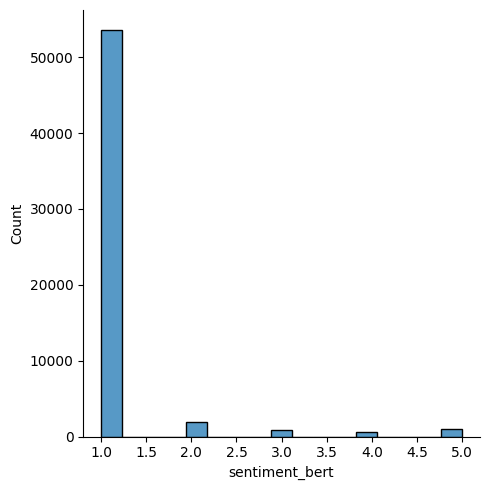

In [215]:
sns.displot(df, x="sentiment_bert")

### Vader Model

In [216]:
def get_vader_polarity(df):

    sia = SentimentIntensityAnalyzer()

    vader_ = {}
    for num, text in enumerate(df['newsText4Algo']):
        print('analyzing news: ', num, 'text: ', text[:10])
        vader_[num] = sia.polarity_scores(text[:512])
    vaders_= pd.DataFrame(vader_).T
    vaders_.columns = [f'vader_'+ col for col in vaders_.columns]
    df = pd.merge(df, vaders_, left_index=True, right_index=True)


    return df

In [217]:
df = get_vader_polarity(df)
df.head()

analyzing news:  0 text:  new york g
analyzing news:  1 text:  new york w
analyzing news:  2 text:   hong kong
analyzing news:  3 text:  asian shar
analyzing news:  4 text:  us stock i
analyzing news:  5 text:  oil back b
analyzing news:  6 text:   axon manu
analyzing news:  7 text:  new york w
analyzing news:  8 text:  new yorklo
analyzing news:  9 text:  new york i
analyzing news:  10 text:  baltimore 
analyzing news:  11 text:   credit su
analyzing news:  12 text:  parishong 
analyzing news:  13 text:  chicagodim
analyzing news:  14 text:  beijing ch
analyzing news:  15 text:  hong kong 
analyzing news:  16 text:  hong kong 
analyzing news:  17 text:  hong kong 
analyzing news:  18 text:  new york g
analyzing news:  19 text:  chinese tr
analyzing news:  20 text:  dubai kuwa
analyzing news:  21 text:  new york u
analyzing news:  22 text:   retailers
analyzing news:  23 text:   ldcs chai
analyzing news:  24 text:  new york u
analyzing news:  25 text:  new york w
analyzing news:  26 te

,newsText,newsText4Algo,date,sentiment_bert,sentiment_dummy_bert,vader_neg,vader_neu,vader_pos,vader_compound
0,NEW YORK Global stock markets jumped on the fi...,new york global stock markets jumped first day...,2020-01-02,1,negative,0.061,0.803,0.135,0.7351
1,NEW YORK Wall Street’s major indexes notched r...,new york wall streets major indexes notched re...,2020-01-02,1,negative,0.073,0.694,0.233,0.9360
2,Hong Kong is the bank’s single most important...,hong kong banks single important market accou...,2020-01-02,1,negative,0.232,0.575,0.192,-0.3818
3,Asian shares gained for the fourth successive ...,asian shares gained fourth successive month de...,2020-01-02,2,neutral,0.064,0.611,0.325,0.9623
4,U.S. stock index futures rose on the first tra...,us stock index futures rose first trading day ...,2020-01-02,1,negative,0.079,0.744,0.177,0.8316


In [218]:
df.to_csv('df_reuters_vader_new.csv', index = False)

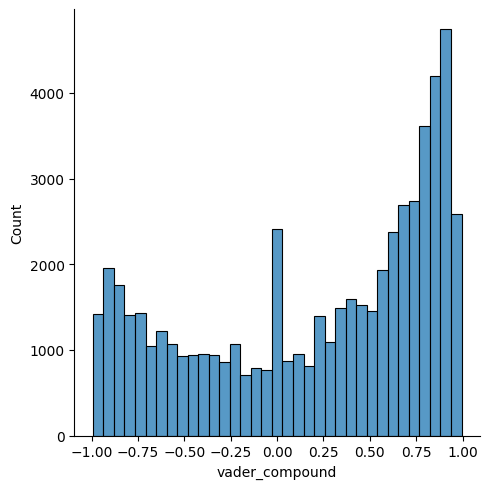

In [219]:
sns.displot(df, x="vader_compound")

In [220]:
df['vader_compound_sent'] = pd.cut(df['vader_compound'], bins= 3, labels = ['negative', 'neutral', 'positive'])
df['vader_compound_dummy'] = df['vader_compound_sent'].map({'negative': 1, 'neutral': 2, 'positive': 3})
df.head()

,newsText,newsText4Algo,date,sentiment_bert,sentiment_dummy_bert,vader_neg,vader_neu,vader_pos,vader_compound,vader_compound_sent,vader_compound_dummy
0,NEW YORK Global stock markets jumped on the fi...,new york global stock markets jumped first day...,2020-01-02,1,negative,0.061,0.803,0.135,0.7351,positive,3
1,NEW YORK Wall Street’s major indexes notched r...,new york wall streets major indexes notched re...,2020-01-02,1,negative,0.073,0.694,0.233,0.9360,positive,3
2,Hong Kong is the bank’s single most important...,hong kong banks single important market accou...,2020-01-02,1,negative,0.232,0.575,0.192,-0.3818,negative,1
3,Asian shares gained for the fourth successive ...,asian shares gained fourth successive month de...,2020-01-02,2,neutral,0.064,0.611,0.325,0.9623,positive,3
4,U.S. stock index futures rose on the first tra...,us stock index futures rose first trading day ...,2020-01-02,1,negative,0.079,0.744,0.177,0.8316,positive,3


In [221]:
df_pivot = df.groupby(['sentiment_bert','vader_compound_dummy']).count().reset_index()
df_pivot = df_pivot.loc[:, ['sentiment_bert', 'vader_compound_dummy']].copy()
df_pivot = pd.pivot_table(df_pivot, index = 'sentiment_bert', columns= 'vader_compound_dummy',
                          aggfunc='sum', fill_value=0)
df_pivot.columns = [f'vader_{str(col[1])}' for col in df_pivot.columns.values]
df_pivot['TotalOriginal'] = df_pivot.sum(axis = 1)
df_pivot.index = df_pivot.index.astype(str)
totals_rows = pd.DataFrame(df_pivot.sum(axis = 0)).T
df_pivot = df_pivot.reset_index(drop = False)
df_pivot = pd.concat([df_pivot, totals_rows]).reset_index(drop = True)
df_pivot.loc[df_pivot.index[-1], 'sentiment_bert'] = 'TotalVADERSentiment'
df_pivot.set_index('sentiment_bert', inplace = True)

df_pivot.iloc[:,:].style.background_gradient(cmap='viridis')

,TotalOriginal
sentiment_bert,
1,0.000000
2,0.000000
3,0.000000
4,0.000000
5,0.000000
TotalVADERSentiment,0.000000


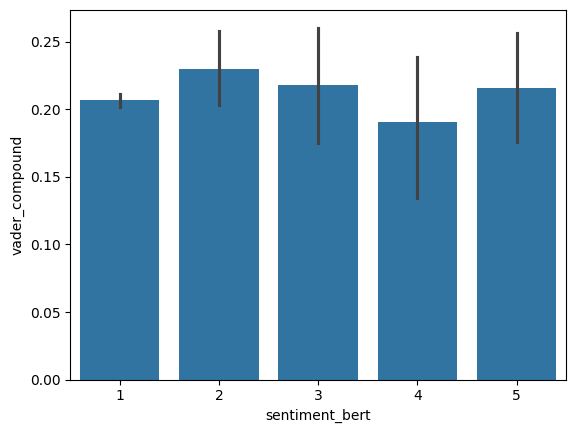

In [222]:
sns.barplot(data=df, x='sentiment_bert', y='vader_compound')
plt.show()

### Roberta Model

In [223]:
tokenizer = AutoTokenizer.from_pretrained(f"cardiffnlp/twitter-roberta-base-sentiment")
model = AutoModelForSequenceClassification.from_pretrained(f"cardiffnlp/twitter-roberta-base-sentiment")

In [224]:
def roberta_sentiment_scores(review):



    tokens = tokenizer.encode(review, return_tensors='pt')
    result = model(tokens)
    scores = torch.softmax(result.logits[0], dim=0).tolist()
    
    # Calculate the compound sentiment score using a weighted sum
    compound_score = (scores[2] - scores[0])  # Positive - Negative
    
    
    scores_dict = {
        'neg': scores[0],
        'neu': scores[1],
        'pos': scores[2],
        'compound': compound_score
    }

    print('row ', review[:10], 'correctly implemented. These are the values:')
    print(scores_dict)
    return scores_dict

In [225]:
def get_roberta_polarity(df):

    roberta_ = {}
    for num, text in enumerate(df['newsText4Algo']):
        print('iteration: ', num)
        roberta_[num] = roberta_sentiment_scores(text[:512])
    robertas_= pd.DataFrame(roberta_).T
    
    robertas_.columns = [f'roberta_'+ col for col in robertas_.columns]
    df = pd.merge(df, robertas_, left_index=True, right_index=True)


    return df

In [226]:
df = get_roberta_polarity(df)

iteration:  0
row  new york g correctly implemented. These are the values:
{'neg': 0.0406792089343071, 'neu': 0.5598584413528442, 'pos': 0.3994622826576233, 'compound': 0.3587830737233162}
iteration:  1
row  new york w correctly implemented. These are the values:
{'neg': 0.008036354556679726, 'neu': 0.3523741662502289, 'pos': 0.6395895481109619, 'compound': 0.6315531935542822}
iteration:  2
row   hong kong correctly implemented. These are the values:
{'neg': 0.6106266975402832, 'neu': 0.3759714961051941, 'pos': 0.013401863165199757, 'compound': -0.5972248343750834}
iteration:  3
row  asian shar correctly implemented. These are the values:
{'neg': 0.019281765446066856, 'neu': 0.5111279487609863, 'pos': 0.4695903956890106, 'compound': 0.45030863024294376}
iteration:  4
row  us stock i correctly implemented. These are the values:
{'neg': 0.012000138871371746, 'neu': 0.4442453384399414, 'pos': 0.5437545776367188, 'compound': 0.531754438765347}
iteration:  5
row  oil back b correctly implem

In [227]:
df['roberta_compound_sent'] = pd.cut(df['roberta_compound'], bins= 3, labels = ['negative', 'neutral', 'positive'])
df['roberta_compound_dummy'] = df['roberta_compound_sent'].map({'negative': 1, 'neutral': 2, 'positive': 3})
df.head()

,newsText,newsText4Algo,date,sentiment_bert,sentiment_dummy_bert,vader_neg,vader_neu,vader_pos,vader_compound,vader_compound_sent,vader_compound_dummy,roberta_neg,roberta_neu,roberta_pos,roberta_compound,roberta_compound_sent,roberta_compound_dummy
0,NEW YORK Global stock markets jumped on the fi...,new york global stock markets jumped first day...,2020-01-02,1,negative,0.061,0.803,0.135,0.7351,positive,3,0.040679,0.559858,0.399462,0.358783,positive,3
1,NEW YORK Wall Street’s major indexes notched r...,new york wall streets major indexes notched re...,2020-01-02,1,negative,0.073,0.694,0.233,0.9360,positive,3,0.008036,0.352374,0.639590,0.631553,positive,3
2,Hong Kong is the bank’s single most important...,hong kong banks single important market accou...,2020-01-02,1,negative,0.232,0.575,0.192,-0.3818,negative,1,0.610627,0.375971,0.013402,-0.597225,negative,1
3,Asian shares gained for the fourth successive ...,asian shares gained fourth successive month de...,2020-01-02,2,neutral,0.064,0.611,0.325,0.9623,positive,3,0.019282,0.511128,0.469590,0.450309,positive,3
4,U.S. stock index futures rose on the first tra...,us stock index futures rose first trading day ...,2020-01-02,1,negative,0.079,0.744,0.177,0.8316,positive,3,0.012000,0.444245,0.543755,0.531754,positive,3


In [228]:
df.to_csv('data_roberta_new.csv', index = False)

In [229]:
df.head()

,newsText,newsText4Algo,date,sentiment_bert,sentiment_dummy_bert,vader_neg,vader_neu,vader_pos,vader_compound,vader_compound_sent,vader_compound_dummy,roberta_neg,roberta_neu,roberta_pos,roberta_compound,roberta_compound_sent,roberta_compound_dummy
0,NEW YORK Global stock markets jumped on the fi...,new york global stock markets jumped first day...,2020-01-02,1,negative,0.061,0.803,0.135,0.7351,positive,3,0.040679,0.559858,0.399462,0.358783,positive,3
1,NEW YORK Wall Street’s major indexes notched r...,new york wall streets major indexes notched re...,2020-01-02,1,negative,0.073,0.694,0.233,0.9360,positive,3,0.008036,0.352374,0.639590,0.631553,positive,3
2,Hong Kong is the bank’s single most important...,hong kong banks single important market accou...,2020-01-02,1,negative,0.232,0.575,0.192,-0.3818,negative,1,0.610627,0.375971,0.013402,-0.597225,negative,1
3,Asian shares gained for the fourth successive ...,asian shares gained fourth successive month de...,2020-01-02,2,neutral,0.064,0.611,0.325,0.9623,positive,3,0.019282,0.511128,0.469590,0.450309,positive,3
4,U.S. stock index futures rose on the first tra...,us stock index futures rose first trading day ...,2020-01-02,1,negative,0.079,0.744,0.177,0.8316,positive,3,0.012000,0.444245,0.543755,0.531754,positive,3


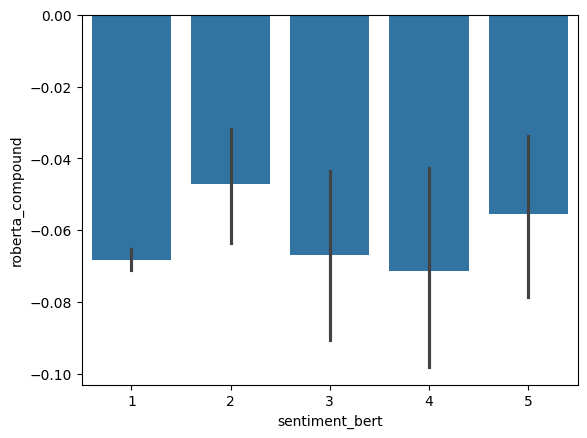

In [230]:
sns.barplot(data=df, x='sentiment_bert', y='roberta_compound')
plt.show()

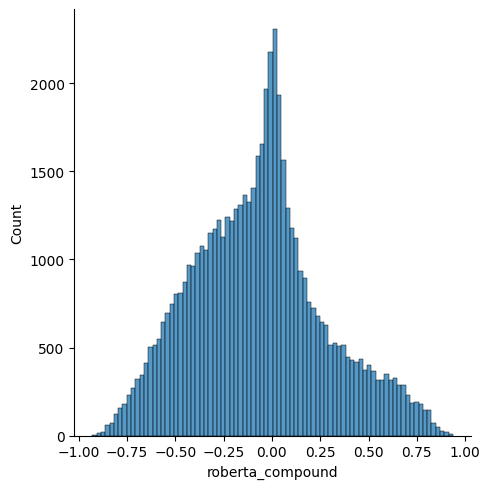

In [231]:
sns.displot(df, x="roberta_compound")

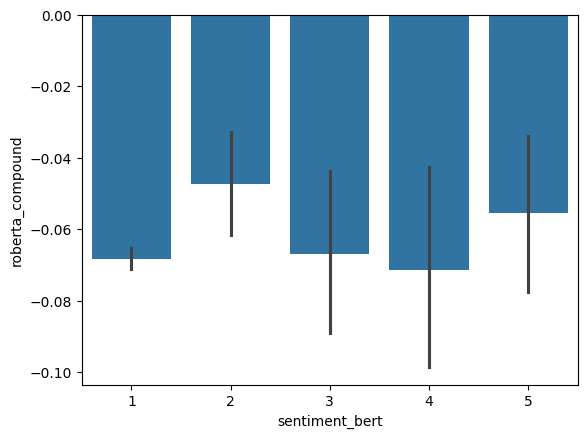

In [232]:
sns.barplot(data=df, x='sentiment_bert', y='roberta_compound')
plt.show()

In [233]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 57704 entries, 0 to 57737
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   newsText                57704 non-null  object        
 1   newsText4Algo           57704 non-null  object        
 2   date                    57704 non-null  datetime64[ns]
 3   sentiment_bert          57704 non-null  int64         
 4   sentiment_dummy_bert    56205 non-null  object        
 5   vader_neg               57704 non-null  float64       
 6   vader_neu               57704 non-null  float64       
 7   vader_pos               57704 non-null  float64       
 8   vader_compound          57704 non-null  float64       
 9   vader_compound_sent     57704 non-null  category      
 10  vader_compound_dummy    57704 non-null  category      
 11  roberta_neg             57704 non-null  float64       
 12  roberta_neu             57704 non-null  float64    

In [234]:
df.loc[df['sentiment_dummy_bert'].isna()]

,newsText,newsText4Algo,date,sentiment_bert,sentiment_dummy_bert,vader_neg,vader_neu,vader_pos,vader_compound,vader_compound_sent,vader_compound_dummy,roberta_neg,roberta_neu,roberta_pos,roberta_compound,roberta_compound_sent,roberta_compound_dummy
88,WASHINGTON The Phase 1 U.S.-China trade deal i...,washington phase uschina trade deal track sign...,2020-01-10,5,NaN,0.000,0.839,0.161,0.7845,positive,3,0.003851,0.184579,0.811571,0.807720,positive,3
173,MEXICO CITY Mexican President Andres Manuel Lo...,mexico city mexican president andres manuel lo...,2020-01-16,5,NaN,0.000,0.581,0.419,0.9750,positive,3,0.003616,0.171726,0.824658,0.821043,positive,3
194,"BEIJING, Jan 16 Chinese financial institutions...",beijing jan chinese financial institutions com...,2020-01-16,5,NaN,0.044,0.710,0.246,0.8268,positive,3,0.024602,0.695212,0.280186,0.255584,neutral,2
201,NEW YORK Key world equity indexes scaled new h...,new york key world equity indexes scaled new h...,2020-01-17,5,NaN,0.030,0.783,0.187,0.9001,positive,3,0.003639,0.248231,0.748130,0.744491,positive,3
229,"NEW YORK, Jan 20 JPMorgan Chase & Co is launch...",new york jan jpmorgan chase co launching new e...,2020-01-20,5,NaN,0.000,0.930,0.070,0.6249,positive,3,0.010664,0.769593,0.219744,0.209080,neutral,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57296,"FRANKFURT, Sept 28 (Reuters) - The European Ce...",frankfurt sept reuters european central bank l...,2023-09-28,4,NaN,0.103,0.851,0.046,-0.6597,negative,1,0.551864,0.431541,0.016594,-0.535270,negative,1
57399,WASHINGTON (Reuters) - Long-serving U.S. Senat...,washington reuters longserving us senator dian...,2023-09-29,5,NaN,0.000,0.806,0.194,0.9137,positive,3,0.006177,0.336789,0.657033,0.650856,positive,3
57438,Katalin Kariko and Drew Weissman received the ...,katalin kariko drew weissman received ultimate...,2023-10-02,5,NaN,0.043,0.853,0.104,0.5106,positive,3,0.011694,0.754054,0.234252,0.222558,neutral,2
57474,"TOKYO, Oct 2 (Reuters) - Shareholder proposals...",tokyo oct reuters shareholder proposals gained...,2023-10-02,4,NaN,0.103,0.705,0.192,0.7184,positive,3,0.045837,0.715256,0.238907,0.193070,neutral,2


In [235]:
df['sentiment_bert'].unique()

array([1, 2, 3, 5, 4], dtype=int64)

In [236]:
df['sentiment_dummy_bert'] = df['sentiment_bert'].map({1: 'negative', 2: 'somewhat negative', 3: 'neutral', 4: 'positive', 5: 'excellent'})

In [237]:
df.to_csv('df_reuters_news_all.csv', index= False)